In [1]:
from __future__ import print_function
import re
import pandas as pd
import numpy as np
from os import listdir
from collections import Counter
from bs4 import BeautifulSoup
import sklearn
import xgboost as xgb
import nltk
from sklearn.model_selection import train_test_split
from nltk.stem.snowball import SnowballStemmer
import math 
import gensim
from nltk.tokenize import RegexpTokenizer
stemmer = SnowballStemmer(language='english', ignore_stopwords=True)
tokenizer = RegexpTokenizer(r'[a-z]{3,}')
from matplotlib import pyplot
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from matplotlib import pylab
%matplotlib inline

In [2]:
def softmax(array):
    e = map (lambda x: sum(map (lambda y: math.pow(math.e, y), x)), array)
    array = map (lambda x, y: map (lambda z: math.pow(math.e, z)/y, x), array, e)
    return np.array(array)

def decision (y):
    m = max(y)
    cc = 0
    for i in y:
        if i == m:
            return cc
        cc +=1

In [3]:
doc_path = 'D:/CC/document_types_ocred_3.1'

doc_types = sorted(listdir(doc_path))

doc_texts = []
doc_htmls = []

for doc_type in doc_types:
    filenames = sorted(listdir(doc_path + '/' + doc_type))
    filenames = filter(lambda x: re.search(r'\.html$', x), filenames)
    for filename in filenames:
        with open(doc_path + '/' + doc_type + '/' + filename, 'r') as ffile:
            html = ffile.read()
            text_bs = BeautifulSoup(html, 'html.parser')
            doc_texts.append((doc_type, filename, BeautifulSoup.get_text(text_bs)))
            doc_htmls.append(html)
            
print(len(doc_texts))

1668


In [21]:
lables, _, texts = zip(*doc_texts)

In [22]:
lables = list(lables)
texts = map (lambda x: stemmer.stem(x), list(texts))
#texts = map(lambda x: tokenizer.tokenize(x), texts)

In [23]:
lable_dict = dict(zip(list(set(lables)), range(len(set(lables)))))
inv_lable_dict = dict(zip(lable_dict.values(), lable_dict.keys()))
print('Number of classes:', len(inv_lable_dict))
print(inv_lable_dict)

Number of classes: 19
{0: 'I9', 1: 'VOE', 2: 'IMMUN', 3: 'Phys', 4: 'Drug test', 5: 'EMP VERF', 6: 'Resume', 7: 'IDs', 8: 'INVC_3', 9: 'BCKGRN', 10: 'COC', 11: 'Other', 12: 'Certs', 13: 'Timecards', 14: 'Blank fax', 15: 'Fit test', 16: 'W4', 17: 'INVC_1', 18: 'INVC_2'}


In [24]:
lables_int = map(lambda x: lable_dict[x], lables)

In [26]:
train_ind, test_ind = train_test_split(range(len(texts)), test_size = 0.2 ,random_state=42)
X = np.array(texts)
y = np.array(lables_int)

X_train = X[train_ind]
X_test = X[test_ind]
y_train = y[train_ind]
y_test = y[test_ind]
#, X_test, y_train, y_test = train_test_split(texts, lables_int, test_size=0.20, random_state=0)

In [27]:
vectorizer = sklearn.feature_extraction.text.TfidfVectorizer(sublinear_tf=False, max_df=1.0, min_df=5, use_idf=True, 
                                                             stop_words='english', lowercase=True, max_features=None,
                                                             strip_accents = 'unicode', ngram_range=(1,2), norm=u'l2',
                                                             smooth_idf=True, token_pattern=r'[a-z\d]{2,}')
vectorizer.fit(X_train)
X_train = vectorizer.transform(X_train)
X_test =  vectorizer.transform(X_test)
X_train.shape

In [28]:
X_train.shape

(1334, 20390)

In [29]:
D_train = xgb.DMatrix(X_train, label = y_train)
D_test = xgb.DMatrix(X_test, label = y_test)

In [30]:
param = {}
param ['booster'] = 'gbtree'
param['objective'] = 'multi:softmax'
param['eta'] = 0.3
param['gamma'] = 0.2
param['min_child_weight'] = 1.0
#param['scale_pos_weight'] = 1.0*(y_train.shape[0] - y_train.sum())/(y_train.sum()+1)
#param['max_delta_step'] = 10
param['max_depth'] = 2
param['silent'] = 0
param['subsample'] = 0.5
param['colsample_bytree' ] = 0.5
param['colsample_bylevel' ] = 0.5
param['alpha' ] = 0.0
param['lambda' ] = 5.0
param['nthread'] = 4
param['num_class'] = len(lable_dict)
# param['one_drop'] = 1
# param['rate_drop'] =  0.2
param['updater']='grow_histmaker,refresh'
# param['sample_type'] =  "weighted"
# param['normalize_type'] = "forest"
param['eval_metric'] = 'merror'
num_round = 200

watchlist  = [(D_test,'eval'), (D_train,'eval')]
bst = xgb.train(param, D_train, num_round, watchlist)

[0]	eval-merror:0.431138	eval-merror:0.348576
[1]	eval-merror:0.392216	eval-merror:0.294603
[2]	eval-merror:0.371257	eval-merror:0.269115
[3]	eval-merror:0.353293	eval-merror:0.247376
[4]	eval-merror:0.362275	eval-merror:0.230885
[5]	eval-merror:0.335329	eval-merror:0.224888
[6]	eval-merror:0.341317	eval-merror:0.213643
[7]	eval-merror:0.323353	eval-merror:0.205397
[8]	eval-merror:0.329341	eval-merror:0.195652
[9]	eval-merror:0.323353	eval-merror:0.184408
[10]	eval-merror:0.314371	eval-merror:0.181409
[11]	eval-merror:0.320359	eval-merror:0.182159
[12]	eval-merror:0.308383	eval-merror:0.176162
[13]	eval-merror:0.302395	eval-merror:0.162669
[14]	eval-merror:0.290419	eval-merror:0.157421
[15]	eval-merror:0.281437	eval-merror:0.155922
[16]	eval-merror:0.266467	eval-merror:0.152924
[17]	eval-merror:0.263473	eval-merror:0.149175
[18]	eval-merror:0.263473	eval-merror:0.145427
[19]	eval-merror:0.248503	eval-merror:0.130435
[20]	eval-merror:0.242515	eval-merror:0.122189
[21]	eval-merror:0.2485

In [32]:
xxx = bst.predict(D_test)

accuracy = 1.0*map(lambda x,y: 1 if x == y else 0, y_test, xxx).count(1)/len(y_test)
print(accuracy)

0.829341317365


In [38]:
bst_probs = softmax(bst.predict(D_test, output_margin=True))

#### CV

In [36]:
doc_path = 'D:/CC/document_types_ocred_3.1'

doc_types = sorted(listdir(doc_path))

doc_texts = []

for doc_type in doc_types:
    filenames = sorted(listdir(doc_path + '/' + doc_type))
    filenames = filter(lambda x: re.search(r'\.html$', x), filenames)
    for filename in filenames:
        with open(doc_path + '/' + doc_type + '/' + filename, 'r') as ffile:
            text_bs = BeautifulSoup(ffile.read(), 'html.parser')            
            doc_texts.append((doc_type, doc_type + '/' + filename, BeautifulSoup.get_text(text_bs)))

In [44]:
lables, _, texts = zip(*doc_texts)
lables = list(lables)
texts = map (lambda x: stemmer.stem(x), list(texts))
texts = map(lambda x: tokenizer.tokenize(x), texts)
texts = map(lambda x: re.sub(r'\s[ -\.\d]+\s', ' ', ' '.join(x)), texts)

In [46]:
# texts = map(lambda x: re.sub(r'(?<=[^\w])20\d\d(?=[^\w]?)', 'year_mask', x), texts)
# texts = map(lambda x: re.sub(r'year_mask +(0[1-9]|1[0-2]) +([0-2][1-9]|3[01])', 'date_mask', x), texts)
# texts = map(lambda x: re.sub(r'year_mask +([0-2][1-9]|3[01]) +(0[1-9]|1[0-2])', 'date_mask', x), texts)
# texts = map(lambda x: re.sub(r'([0-2][1-9]|3[01]) +(0[1-9]|1[0-2]) +year_mask', 'date_mask', x), texts)
# texts = map(lambda x: re.sub(r'(0[1-9]|1[0-2]) +([0-2][1-9]|3[01]) +year_mask', 'date_mask', x), texts)

lable_dict = dict(zip(list(set(lables)), range(len(set(lables)))))
inv_lable_dict = dict(zip(lable_dict.values(), lable_dict.keys()))

lables_int = np.array(map(lambda x: lable_dict[x], lables))

# vectorizer = sklearn.feature_extraction.text.TfidfVectorizer(sublinear_tf=False, max_df=1.0, min_df=5, use_idf=True, 
#                                                              stop_words='english', lowercase=True, max_features=None,
#                                                              strip_accents = 'unicode', ngram_range=(1,3), norm=u'l2',
#                                                              smooth_idf=True, token_pattern=r'[a-z]{3,}')

# X = vectorizer.fit_transform(texts)
X = np.array(texts)
y = lables_int

In [47]:
print(X.shape)
print('# classes:', len(lable_dict))
for i in lable_dict.keys():
    print(i, ' '*(10-len(i)),':', list(lables_int).count(lable_dict[i]))
print(lable_dict)

(1668L,)
# classes: 19
I9          : 72
VOE         : 73
IMMUN       : 39
Phys        : 110
Drug test   : 108
EMP VERF    : 69
Resume      : 55
IDs         : 54
INVC_3      : 41
BCKGRN      : 70
COC         : 55
Other       : 419
Certs       : 90
Timecards   : 62
Blank fax   : 36
Fit test    : 108
W4          : 119
INVC_1      : 53
INVC_2      : 35
{'I9': 0, 'VOE': 1, 'IMMUN': 2, 'Phys': 3, 'Drug test': 4, 'EMP VERF': 5, 'Resume': 6, 'IDs': 7, 'INVC_3': 8, 'BCKGRN': 9, 'COC': 10, 'Other': 11, 'Certs': 12, 'Timecards': 13, 'Blank fax': 14, 'Fit test': 15, 'W4': 16, 'INVC_1': 17, 'INVC_2': 18}


In [48]:
cv = sklearn.model_selection.KFold(n_splits=5, random_state=42, shuffle=True)

In [54]:
param = {}
param ['booster'] = 'gbtree'
param['objective'] = 'multi:softmax'
param['eta'] = 0.3
param['gamma'] = 0.1
param['min_child_weight'] = 0.1
#param['scale_pos_weight'] = 1.0*(y_train.shape[0] - y_train.sum())/(y_train.sum()+1)
#param['max_delta_step'] = 10
param['max_depth'] = 5
param['silent'] = 1
param['subsample'] = 0.5
param['colsample_bytree' ] = 0.5
param['colsample_bylevel' ] = 0.5
param['alpha' ] = 0.0
param['lambda' ] = 5.0
param['nthread'] = 4
param['num_class'] = len(lable_dict)
# param['one_drop'] = 1
# param['rate_drop'] =  0.2
param['updater']='grow_histmaker,prune'
# param['sample_type'] =  "weighted"
# param['normalize_type'] = "forest"
param['eval_metric'] = 'merror'
num_round = 200

In [55]:
cc = 0
accs = []
incorrect_classes = Counter()
incorrect_files = Counter()
common_mistakes = Counter()
for i ,j in  cv.split(range(len(doc_texts))):
    print ('Fold', cc, '...')
    X_train, X_test = X[i], X[j]
    y_train, y_test = y[i], y[j]
    
    vectorizer = sklearn.feature_extraction.text.TfidfVectorizer(sublinear_tf=False, max_df=1.0, min_df=5, use_idf=True, 
                                                             stop_words='english', lowercase=True, max_features=None,
                                                             strip_accents = 'unicode', ngram_range=(1,3), norm=u'l2',
                                                             smooth_idf=True, token_pattern=r'[a-z\d]{2,}')
    vectorizer.fit(X_train)
    X_train = vectorizer.transform(X_train)
    X_test =  vectorizer.transform(X_test)
    
    D_train = xgb.DMatrix(X_train, label = y_train)
    D_test = xgb.DMatrix(X_test, label = y_test)
    
    bst = xgb.train(param, D_train, num_round)
    xxx = bst.predict(D_test)

    accuracy = 1.0*map(lambda x,y: 1 if x == y else 0, y_test, xxx).count(1)/len(y_test)
    accs.append(accuracy)
    
    for pr in range(len(xxx)):
        if xxx[pr] != y_test[pr]:
#            print('pred:', inv_lable_dict[xxx[pr]])
#            print('true:', inv_lable_dict[y_test[pr]])
#            print(doc_texts[j[pr]][1], '\n')
            incorrect_classes[inv_lable_dict[y_test[pr]]] += 1
            incorrect_files[doc_texts[j[pr]][1]] += 1
            common_mistakes[(inv_lable_dict[xxx[pr]], inv_lable_dict[y_test[pr]])] += 1
            #print(doc_texts[j][2])
    
    print ('---------------------------------\n', 'Done')
    print ('Fold', cc, 'accuracy :\t', accuracy, '\n')
    cc += 1
cv_acc = sum(accs)/len(accs)
print ('%s-Fold cross-validation accuracy over %s classes for the basic BST model is:' % (cv.n_splits,len(lable_dict)), cv_acc)

Fold 0 ...
---------------------------------
 Done
Fold 0 accuracy :	 0.802395209581 

Fold 1 ...
---------------------------------
 Done
Fold 1 accuracy :	 0.820359281437 

Fold 2 ...
---------------------------------
 Done
Fold 2 accuracy :	 0.793413173653 

Fold 3 ...
---------------------------------
 Done
Fold 3 accuracy :	 0.795795795796 

Fold 4 ...
---------------------------------
 Done
Fold 4 accuracy :	 0.804804804805 

5-Fold cross-validation accuracy over 19 classes for the basic BST model is: 0.803353653054


In [57]:
sorted(incorrect_classes.items(), key =lambda x: x[1], reverse = True)

[('Other', 75),
 ('BCKGRN', 37),
 ('IMMUN', 22),
 ('Certs', 21),
 ('Phys', 19),
 ('COC', 17),
 ('Blank fax', 16),
 ('INVC_3', 15),
 ('Fit test', 14),
 ('INVC_1', 14),
 ('INVC_2', 13),
 ('VOE', 12),
 ('EMP VERF', 11),
 ('IDs', 11),
 ('W4', 11),
 ('Drug test', 8),
 ('I9', 4),
 ('Resume', 4),
 ('Timecards', 4)]

In [58]:
print(len(incorrect_files))
sorted(incorrect_files.items(), key =lambda x: x[1], reverse = True)

328


[('Other/FAX_20170505_1494008613_178.pdf.html', 1),
 ('Other/FAX_20170425_1493126608_179.pdf.html', 1),
 ('INVC_1/1 - scanner_20170322_103058.jpg.html', 1),
 ('Other/FAX_20170503_1493828516_126.pdf.html', 1),
 ('INVC_2/FAX_20170516_1494968423_136.pdf.html', 1),
 ('Other/FAX_20170504_1493922728_140.pdf.html', 1),
 ('IMMUN/P_176238_2_081408.pdf.html', 1),
 ('Other/FAX_20170418_1492539732_116.pdf.html', 1),
 ('EMP VERF/FAX_20170501_1493648257_161.pdf.html', 1),
 ('INVC_3/FAX_20161011_1476205345_83.pdf.html', 1),
 ('BCKGRN/FAX_20161013_1476395413_21.pdf.html', 1),
 ('Other/FAX_20170303_1488545537_161.pdf.html', 1),
 ('Blank fax/FAX_20170313_1489420476_166.pdf.html', 1),
 ('Other/FAX_20161010_1476120249_172.pdf.html', 1),
 ('Phys/P_738943_3_PHYS05.pdf.html', 1),
 ('Other/FAX_20170503_1493827604_99.pdf.html', 1),
 ('INVC_1/FAX_20170306_1488826358_51.pdf.html', 1),
 ('Other/FAX_20170418_1492488890_124.pdf.html', 1),
 ('Blank fax/FAX_20160929_1475177602_17.pdf.html', 1),
 ('Fit test/P_786446_3

In [59]:
print(len(incorrect_files))
sorted(common_mistakes.items(), key =lambda x: x[1], reverse = True)

328


[(('Other', 'BCKGRN'), 30),
 (('BCKGRN', 'Other'), 17),
 (('IDs', 'Blank fax'), 11),
 (('IDs', 'Other'), 10),
 (('IDs', 'Certs'), 10),
 (('Other', 'Certs'), 9),
 (('Phys', 'Other'), 9),
 (('W4', 'Other'), 9),
 (('Fit test', 'Phys'), 8),
 (('IDs', 'W4'), 8),
 (('Other', 'IMMUN'), 8),
 (('Other', 'INVC_2'), 7),
 (('COC', 'IMMUN'), 7),
 (('Other', 'VOE'), 7),
 (('Other', 'INVC_3'), 6),
 (('IMMUN', 'COC'), 6),
 (('Other', 'Phys'), 6),
 (('VOE', 'EMP VERF'), 6),
 (('Other', 'Fit test'), 6),
 (('Certs', 'Other'), 5),
 (('Other', 'INVC_1'), 5),
 (('Other', 'Blank fax'), 5),
 (('VOE', 'BCKGRN'), 4),
 (('Other', 'COC'), 4),
 (('Fit test', 'Other'), 4),
 (('Phys', 'Fit test'), 4),
 (('VOE', 'Other'), 4),
 (('Other', 'IDs'), 4),
 (('COC', 'Other'), 4),
 (('INVC_2', 'INVC_3'), 4),
 (('INVC_3', 'INVC_1'), 4),
 (('Other', 'I9'), 3),
 (('IDs', 'INVC_1'), 3),
 (('Phys', 'COC'), 3),
 (('Blank fax', 'IDs'), 3),
 (('Other', 'Resume'), 3),
 (('INVC_3', 'INVC_2'), 3),
 (('Phys', 'IMMUN'), 3),
 (('Other', '

In [61]:
feature_imp = sorted(bst.get_fscore().items(), key=lambda x: x[1], reverse=True)
feature_imp

[('f9113', 189),
 ('f5978', 173),
 ('f16428', 173),
 ('f11964', 101),
 ('f14259', 87),
 ('f23523', 69),
 ('f22116', 58),
 ('f15666', 56),
 ('f17137', 56),
 ('f24185', 55),
 ('f22007', 53),
 ('f19865', 52),
 ('f8027', 50),
 ('f23345', 50),
 ('f2259', 50),
 ('f22', 49),
 ('f21450', 49),
 ('f9809', 47),
 ('f10701', 47),
 ('f7743', 47),
 ('f4414', 43),
 ('f14066', 43),
 ('f103', 42),
 ('f19', 40),
 ('f17316', 40),
 ('f98', 40),
 ('f18775', 40),
 ('f16663', 38),
 ('f3353', 37),
 ('f16005', 37),
 ('f23056', 35),
 ('f22776', 35),
 ('f3237', 34),
 ('f4572', 34),
 ('f10113', 33),
 ('f21176', 33),
 ('f20190', 33),
 ('f16757', 33),
 ('f1', 32),
 ('f749', 32),
 ('f6504', 32),
 ('f25266', 31),
 ('f46', 30),
 ('f6621', 30),
 ('f706', 29),
 ('f11656', 27),
 ('f20011', 27),
 ('f9677', 26),
 ('f461', 26),
 ('f11468', 26),
 ('f9252', 25),
 ('f21051', 25),
 ('f17497', 25),
 ('f21145', 25),
 ('f20752', 24),
 ('f15176', 24),
 ('f96', 24),
 ('f3495', 24),
 ('f6326', 23),
 ('f22853', 23),
 ('f24483', 23),
 (

In [62]:
feature_dict = vectorizer.get_feature_names()
inv_feature_dict = dict(zip(map(lambda x: 'f'+ str(x), range(len(feature_dict))), feature_dict))

In [63]:
a = []
for i in feature_imp:
    a.append(inv_feature_dict[i[0]])
    print(inv_feature_dict[i[0]],' '*(30-len(inv_feature_dict[i[0]])) ,i[1])

fax                             189
date                            173
page                            173
information                     101
medical                         87
total                           69
state                           58
number                          56
phone                           56
use                             55
st                              53
required                        52
employment                      50
time                            50
aureus                          50
05                              49
signature                       49
form                            47
health                          47
employee                        47
com                             43
mar                             43
2017                            42
03                              40
pm                              40
2016                            40
receipt                         40
patient                         38
care            

### Doc2Vec

In [2]:
doc_path = 'D:/CC/document_types_ocred_3.1'

doc_types = sorted(listdir(doc_path))

doc_texts = []
doc_htmls = []

for doc_type in doc_types:
    filenames = sorted(listdir(doc_path + '/' + doc_type))
    filenames = filter(lambda x: re.search(r'\.html$', x), filenames)
    for filename in filenames:
        with open(doc_path + '/' + doc_type + '/' + filename, 'r') as ffile:
            html = ffile.read()
            text_bs = BeautifulSoup(html, 'html.parser')
            doc_texts.append((doc_type, filename, BeautifulSoup.get_text(text_bs)))
            doc_htmls.append(html)
            
print(len(doc_texts))

1668


In [3]:
lables, filenames, texts = zip(*doc_texts)
lables = list(lables)
filenames = list(filenames)
texts = map (lambda x: stemmer.stem(x), list(texts))
lable_dict = dict(zip(list(set(lables)), range(len(set(lables)))))
inv_lable_dict = dict(zip(lable_dict.values(), lable_dict.keys()))

lables_int = np.array(map(lambda x: lable_dict[x], lables))

texts = map(lambda x: tokenizer.tokenize(x), texts)

In [29]:
X_train, X_test, y_train, y_test = train_test_split(texts, lables_int, test_size=0.20, random_state=42)

In [28]:
d2v_train =map(lambda x,y: gensim.models.doc2vec.TaggedDocument(x, [y]), texts, range(len(texts)))

In [29]:
doc_vecs = gensim.models.doc2vec.Doc2Vec(d2v_train, size=300, window=3, min_count=1, workers=8, iter=1000)

In [32]:
X_train = map(lambda x: doc_vecs.infer_vector(x), X_train)
X_test = map(lambda x: doc_vecs.infer_vector(x), X_test)

In [33]:
D_train = xgb.DMatrix(X_train, label = y_train)
D_test = xgb.DMatrix(X_test, label = y_test)

In [35]:
param = {}
param ['booster'] = 'gbtree'
param['objective'] = 'multi:softmax'
param['eta'] = 0.9
param['gamma'] = 1.0
param['min_child_weight'] = 1.0
#param['scale_pos_weight'] = 1.0*(y_train.shape[0] - y_train.sum())/(y_train.sum()+1)
#param['max_delta_step'] = 10
param['max_depth'] = 5
param['silent'] = 1
param['subsample'] = 0.1
param['colsample_bytree' ] = 0.1
param['colsample_bylevel' ] = 0.1
param['alpha' ] = 0.0
param['lambda' ] = 100.0
param['nthread'] = 4
param['num_class'] = len(lable_dict)
# param['one_drop'] = 1
# param['rate_drop'] =  0.2
param['updater']='grow_histmaker,refresh'
# param['sample_type'] =  "weighted"
# param['normalize_type'] = "forest"
param['eval_metric'] = 'merror'
num_round = 5000

watchlist  = [(D_test,'eval'), (D_train,'eval')]
bst = xgb.train(param, D_train, num_round, watchlist)
bst.eval(D_test)

[0]	eval-merror:0.894737	eval-merror:0.805522
[1]	eval-merror:0.84689	eval-merror:0.792317
[2]	eval-merror:0.842105	eval-merror:0.755102
[3]	eval-merror:0.808612	eval-merror:0.702281
[4]	eval-merror:0.779904	eval-merror:0.673469
[5]	eval-merror:0.751196	eval-merror:0.65066
[6]	eval-merror:0.732057	eval-merror:0.629052
[7]	eval-merror:0.732057	eval-merror:0.613445
[8]	eval-merror:0.708134	eval-merror:0.602641
[9]	eval-merror:0.688995	eval-merror:0.582233
[10]	eval-merror:0.679426	eval-merror:0.548619
[11]	eval-merror:0.684211	eval-merror:0.540216
[12]	eval-merror:0.665072	eval-merror:0.533013
[13]	eval-merror:0.641148	eval-merror:0.517407
[14]	eval-merror:0.617225	eval-merror:0.506603
[15]	eval-merror:0.61244	eval-merror:0.5006
[16]	eval-merror:0.593301	eval-merror:0.483794
[17]	eval-merror:0.588517	eval-merror:0.484994
[18]	eval-merror:0.578947	eval-merror:0.468187
[19]	eval-merror:0.569378	eval-merror:0.454982
[20]	eval-merror:0.574163	eval-merror:0.453782
[21]	eval-merror:0.569378	ev

u'[0]\teval-merror:0.291866'

### Word2Vec CBOW

In [30]:
#cbow
word_model = gensim.models.word2vec.Word2Vec(texts, size=300, window=5, min_count=1, workers=8, iter=1000)

In [31]:
word_matrix = []
for i in word_model.vocab:
    word_matrix.append(word_model[i])
word_matrix = np.array(word_matrix)
word_matrix.shape

(78549L, 300L)

In [32]:
texts, lables_int = zip(*filter(lambda x: len(x[0])>0, zip(texts, lables_int)))
texts = list(texts)
lables_int = list(lables_int)
X_train_text, X_test_text, y_train, y_test = train_test_split(texts, lables_int, test_size=0.20, random_state=42)

In [59]:
X_train = map(lambda y: np.mean(np.array(map(lambda x: word_model[x], y)), axis=0), X_train_text)
X_test = map(lambda y: np.mean(np.array(map(lambda x: word_model[x], y)), axis=0), X_test_text)

In [60]:
D_train = xgb.DMatrix(X_train, label = y_train)
D_test = xgb.DMatrix(X_test, label = y_test)

In [61]:
param = {}
param ['booster'] = 'gbtree'
param['objective'] = 'multi:softmax'
param['eta'] = 0.3
param['gamma'] = 0.1
param['min_child_weight'] = 0.5
#param['scale_pos_weight'] = 1.0*(y_train.shape[0] - y_train.sum())/(y_train.sum()+1)
#param['max_delta_step'] = 10
param['max_depth'] = 5
param['silent'] = 0
param['subsample'] = 0.5
param['colsample_bytree' ] = 0.8
param['colsample_bylevel' ] = 0.8
param['alpha' ] = 0
param['lambda' ] = 100.0
param['nthread'] = 4
param['num_class'] = len(lable_dict)
# param['one_drop'] = 1
# param['rate_drop'] =  0.2
param['updater']='grow_histmaker,refresh'
# param['sample_type'] =  "weighted"
# param['normalize_type'] = "forest"
param['eval_metric'] = 'merror'
num_round = 150

watchlist  = [(D_test,'eval'), (D_train,'eval')]
bst = xgb.train(param, D_train, num_round, watchlist)
bst.eval(D_test)

[0]	eval-merror:0.553191	eval-merror:0.49393
[1]	eval-merror:0.56535	eval-merror:0.508346
[2]	eval-merror:0.544073	eval-merror:0.499241
[3]	eval-merror:0.516717	eval-merror:0.472686
[4]	eval-merror:0.510638	eval-merror:0.461305
[5]	eval-merror:0.50152	eval-merror:0.441578
[6]	eval-merror:0.489362	eval-merror:0.41654
[7]	eval-merror:0.480243	eval-merror:0.390744
[8]	eval-merror:0.446809	eval-merror:0.35736
[9]	eval-merror:0.440729	eval-merror:0.348255
[10]	eval-merror:0.428571	eval-merror:0.336874
[11]	eval-merror:0.419453	eval-merror:0.316388
[12]	eval-merror:0.413374	eval-merror:0.295903
[13]	eval-merror:0.407295	eval-merror:0.282246
[14]	eval-merror:0.410334	eval-merror:0.276935
[15]	eval-merror:0.407295	eval-merror:0.270106
[16]	eval-merror:0.392097	eval-merror:0.256449
[17]	eval-merror:0.370821	eval-merror:0.240516
[18]	eval-merror:0.37386	eval-merror:0.229894
[19]	eval-merror:0.370821	eval-merror:0.218513
[20]	eval-merror:0.367781	eval-merror:0.211684
[21]	eval-merror:0.355623	eva

u'[0]\teval-merror:0.224924'

In [62]:
xxx = bst.predict(D_test)

accuracy = 1.0*map(lambda x,y: 1 if x == y else 0, y_test, xxx).count(1)/len(y_test)
print(accuracy)

0.775075987842


#### CV

In [63]:
texts, lables_int = zip(*filter(lambda x: len(x[0])>0, zip(texts, lables_int)))
texts = list(texts)
lables_int = list(lables_int)

In [64]:
X = np.array(texts)
y = np.array(lables_int)

In [65]:
cv = sklearn.model_selection.KFold(n_splits=5, random_state=42, shuffle=True)

In [66]:
param = {}
param ['booster'] = 'gbtree'
param['objective'] = 'multi:softmax'
param['eta'] = 0.3
param['gamma'] = 0.1
param['min_child_weight'] = 0.5
#param['scale_pos_weight'] = 1.0*(y_train.shape[0] - y_train.sum())/(y_train.sum()+1)
#param['max_delta_step'] = 10
param['max_depth'] = 5
param['silent'] = 0
param['subsample'] = 0.5
param['colsample_bytree' ] = 0.8
param['colsample_bylevel' ] = 0.8
param['alpha' ] = 0
param['lambda' ] = 100.0
param['nthread'] = 4
param['num_class'] = len(lable_dict)
# param['one_drop'] = 1
# param['rate_drop'] =  0.2
param['updater']='grow_histmaker,refresh'
# param['sample_type'] =  "weighted"
# param['normalize_type'] = "forest"
param['eval_metric'] = 'merror'
num_round = 250

In [67]:
cc = 0
accs = []
incorrect_classes = Counter()
incorrect_files = Counter()
common_mistakes = Counter()
for i ,j in  cv.split(range(len(X))):
    print ('Fold', cc, '...')
    X_train_text, X_test_text = X[i], X[j]
    y_train, y_test = y[i], y[j]
    
    X_train = map(lambda y: np.mean(np.array(map(lambda x: word_model[x], y)), axis=0), X_train_text)
    X_test = map(lambda y: np.mean(np.array(map(lambda x: word_model[x], y)), axis=0), X_test_text)
    
    D_train = xgb.DMatrix(X_train, label = y_train)
    D_test = xgb.DMatrix(X_test, label = y_test)
    
    
#    watchlist  = [(D_test,'eval'), (D_train,'eval')]
    bst = xgb.train(param, D_train, num_round)
    xxx = bst.predict(D_test)

    accuracy = 1.0*map(lambda x,y: 1 if x == y else 0, y_test, xxx).count(1)/len(y_test)
    accs.append(accuracy)
    
    for pr in range(len(xxx)):
        if xxx[pr] != y_test[pr]:
#             print('pred:', inv_lable_dict[xxx[pr]])
#             print('true:', inv_lable_dict[y_test[pr]])
#             print(doc_texts[j[pr]][1], '\n')
            incorrect_classes[inv_lable_dict[y_test[pr]]] += 1
            incorrect_files[doc_texts[j[pr]][1]] += 1
            common_mistakes[(inv_lable_dict[xxx[pr]], inv_lable_dict[y_test[pr]])] += 1
            #print(doc_texts[j][2])
    
    print ('---------------------------------\n', 'Done')
    print ('Fold', cc, 'accuracy :\t', accuracy, '\n')
    cc += 1    
cv_acc = sum(accs)/len(accs)
print ('%s-Fold cross-validation accuracy over %s classes for the basic BST model is:' % (cv.n_splits,len(lable_dict)), cv_acc)

Fold 0 ...
---------------------------------
 Done
Fold 0 accuracy :	 0.821212121212 

Fold 1 ...
---------------------------------
 Done
Fold 1 accuracy :	 0.766666666667 

Fold 2 ...
---------------------------------
 Done
Fold 2 accuracy :	 0.756838905775 

Fold 3 ...
---------------------------------
 Done
Fold 3 accuracy :	 0.781155015198 

Fold 4 ...
---------------------------------
 Done
Fold 4 accuracy :	 0.775075987842 

5-Fold cross-validation accuracy over 19 classes for the basic BST model is: 0.780189739339


In [56]:
sorted(incorrect_classes.items(), key =lambda x: x[1], reverse = True)

[('Other', 71),
 ('BCKGRN', 41),
 ('VOE', 27),
 ('IDs', 26),
 ('Certs', 23),
 ('IMMUN', 21),
 ('Blank fax', 21),
 ('Phys', 18),
 ('INVC_3', 18),
 ('COC', 18),
 ('EMP VERF', 15),
 ('Fit test', 11),
 ('Drug test', 10),
 ('INVC_2', 10),
 ('W4', 8),
 ('INVC_1', 8),
 ('Resume', 7),
 ('Timecards', 5),
 ('I9', 4)]

In [57]:
print(len(incorrect_files))
sorted(common_mistakes.items(), key =lambda x: x[1], reverse = True)

361


[(('Other', 'BCKGRN'), 37),
 (('BCKGRN', 'Other'), 21),
 (('Other', 'VOE'), 18),
 (('Other', 'Certs'), 15),
 (('Other', 'EMP VERF'), 12),
 (('Other', 'IDs'), 11),
 (('Other', 'IMMUN'), 9),
 (('COC', 'IMMUN'), 9),
 (('Other', 'INVC_3'), 8),
 (('Other', 'Phys'), 8),
 (('Other', 'Blank fax'), 8),
 (('W4', 'Other'), 8),
 (('BCKGRN', 'VOE'), 7),
 (('Certs', 'IDs'), 7),
 (('Phys', 'Other'), 7),
 (('Other', 'INVC_2'), 6),
 (('Phys', 'COC'), 6),
 (('IDs', 'Other'), 5),
 (('INVC_1', 'INVC_3'), 5),
 (('IMMUN', 'COC'), 5),
 (('IDs', 'Certs'), 5),
 (('Fit test', 'Phys'), 5),
 (('EMP VERF', 'Other'), 5),
 (('Other', 'Drug test'), 4),
 (('IMMUN', 'Drug test'), 4),
 (('Fit test', 'Other'), 4),
 (('IDs', 'W4'), 4),
 (('Phys', 'Fit test'), 4),
 (('Certs', 'Other'), 4),
 (('Other', 'Resume'), 4),
 (('Other', 'Timecards'), 4),
 (('Other', 'W4'), 4),
 (('INVC_2', 'INVC_3'), 4),
 (('Other', 'Fit test'), 4),
 (('VOE', 'BCKGRN'), 3),
 (('Other', 'COC'), 3),
 (('Certs', 'Resume'), 3),
 (('Drug test', 'IMMUN')

#### Visualisation of the CBOW space

In [82]:
texts, filenames, lables_int = zip(*filter(lambda x: len(x[0])>0, zip(texts, filenames, lables_int)))
texts = list(texts)
filenames = list(filenames)
lables_int = list(lables_int)

X = map(lambda y: np.mean(np.array(map(lambda x: word_model[x], y)), axis=0), texts)
y_ = lables_int

In [83]:
tsne = TSNE(perplexity=100, n_components=2, init='pca', n_iter=500)

two_d_embeddings_Wdocs = tsne.fit_transform(X)
colors = plt.cm.Spectral(np.linspace(0, 1, len(set(y_))))

In [84]:
embs_by_class = []
aux = zip(two_d_embeddings_Wdocs, filenames, y_)
for i in sorted(list(set(y_))):
    embs_by_class.append(map(lambda x: (x[0], x[1]), filter(lambda y: y[2] == i, aux)))    

C:\Program Files\Anaconda2\lib\site-packages\matplotlib\lines.py:1145: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
  if self._markerfacecolor != fc:


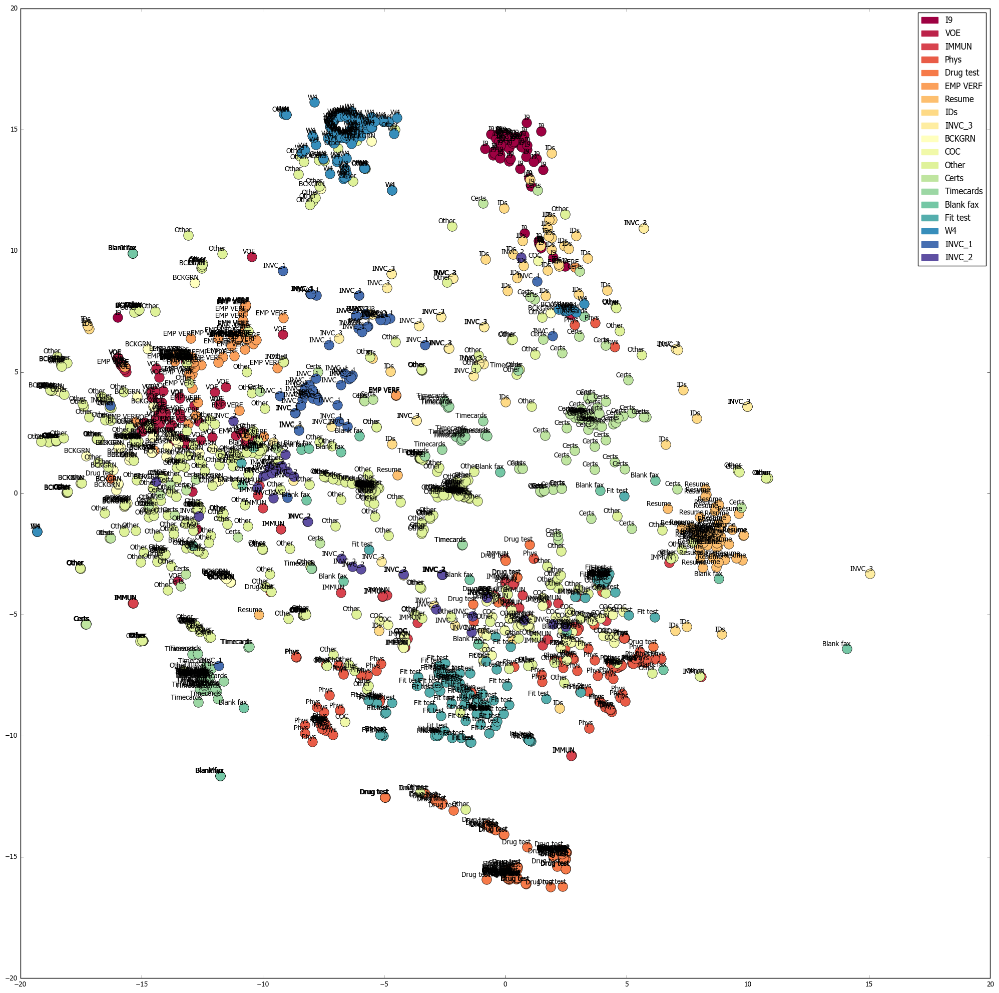

In [85]:
import matplotlib.patches as mpatches
pylab.figure(figsize=(25,25))
pylab.rc('font', family='Tahoma')
leg = []
for j,c in enumerate(colors):
    patch = mpatches.Patch(color=c, label=inv_lable_dict[sorted(list(set(y_)))[j]])
    leg.append(patch)
    for i,k in enumerate(embs_by_class[j]):
        
        x, y = embs_by_class[j][i][0]
        
        plt.plot(x, y, 'o', markerfacecolor=c, markersize=14)
        plt.annotate(inv_lable_dict[sorted(list(set(y_)))[j]],  xy=(x, y), xytext=(5, 2), textcoords='offset points',
                      ha='right', va='bottom')
#         plt.annotate(embs_by_class[j][i][1],  xy=(x, y), xytext=(5, 2), textcoords='offset points',
#                      ha='right', va='bottom')
    
plt.legend(handles=leg)
# plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3,
#            ncol=2, mode="expand", borderaxespad=0.)
plt.show()

### Dataset Size/Error

In [358]:
import random
import scipy

In [333]:
param = {}
param ['booster'] = 'gbtree'
param['objective'] = 'multi:softmax'
param['eta'] = 0.3
param['gamma'] = 0.1
param['min_child_weight'] = 0.5
#param['scale_pos_weight'] = 1.0*(y_train.shape[0] - y_train.sum())/(y_train.sum()+1)
#param['max_delta_step'] = 10
param['max_depth'] = 5
param['silent'] = 0
param['subsample'] = 0.8
param['colsample_bytree' ] = 1.0
param['colsample_bylevel' ] = 1.0
param['alpha' ] = 0
param['lambda' ] = 100.0
param['nthread'] = 4
param['num_class'] = len(lable_dict)
# param['one_drop'] = 1
# param['rate_drop'] =  0.2
param['updater']='grow_histmaker,refresh'
# param['sample_type'] =  "weighted"
# param['normalize_type'] = "forest"
param['eval_metric'] = 'merror'
num_round = 150

Train size: 1 	Train error: 1.0
Test size: 1 	Test error: 1.0
Train size: 6 	Train error: 0.833333
Test size: 2 	Test error: 0.5
Train size: 11 	Train error: 0.818182
Test size: 3 	Test error: 1.0
Train size: 16 	Train error: 0.0
Test size: 4 	Test error: 0.5
Train size: 21 	Train error: 0.0
Test size: 5 	Test error: 0.2
Train size: 26 	Train error: 0.0
Test size: 6 	Test error: 0.833333
Train size: 31 	Train error: 0.032258
Test size: 7 	Test error: 0.571429
Train size: 36 	Train error: 0.027778
Test size: 8 	Test error: 0.5
Train size: 41 	Train error: 0.0
Test size: 9 	Test error: 0.555556
Train size: 46 	Train error: 0.0
Test size: 10 	Test error: 0.5
Train size: 51 	Train error: 0.0
Test size: 11 	Test error: 0.454545
Train size: 56 	Train error: 0.0
Test size: 12 	Test error: 0.416667
Train size: 61 	Train error: 0.016393
Test size: 13 	Test error: 0.461538
Train size: 66 	Train error: 0.0
Test size: 14 	Test error: 0.5
Train size: 71 	Train error: 0.014085
Test size: 15 	Test er

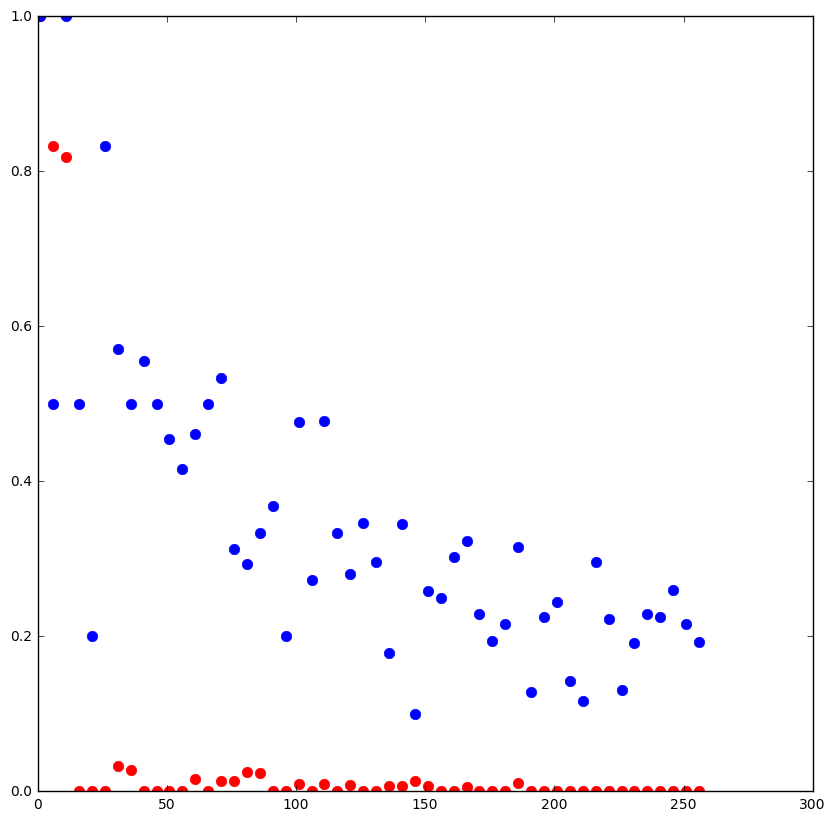

In [357]:
random.seed(42)
pylab.figure(figsize=(10,10))
pylab.rc('font', family='DejaVu Sans')
Xy_train = zip(X_train, y_train)
Xy_test = zip(X_test, y_test)
test_errors =[]
train_errors = []
for i in range(1,len(X_train), 5):    
    Xy_train_sample = random.sample(Xy_train, i)
    Xy_test_sample = random.sample(Xy_test, i/5 + 1)
    X_train_sample, y_train_sample = zip(*Xy_train_sample)
    X_test_sample, y_test_sample = zip(*Xy_test_sample)
    
    X_train_sample = list(X_train_sample)
    X_test_sample = list(X_test_sample)
    y_train_sample = list(y_train_sample)
    y_test_sample = list(y_test_sample)
    
    D_train_sample = xgb.DMatrix(X_train_sample, label = y_train_sample)
    D_test_sample = xgb.DMatrix(X_test_sample, label = y_test_sample)
    
    bst_step = xgb.train(param, D_train_sample, num_round)
    train_error = float(bst_step.eval(D_train_sample)[16:])
    test_error = float(bst_step.eval(D_test_sample)[16:])
    print('Train size:', i, '\tTrain error:', train_error)
    print('Test size:', i/5 + 1, '\tTest error:', test_error) 
    plt.plot(i, train_error, '.', color='red', markersize=15)
    plt.plot(i, test_error, '.',  color='blue', markersize=15)
    test_errors.append(test_error)
    train_errors.append(train_error)
plt.show()

<function matplotlib.pyplot.show>

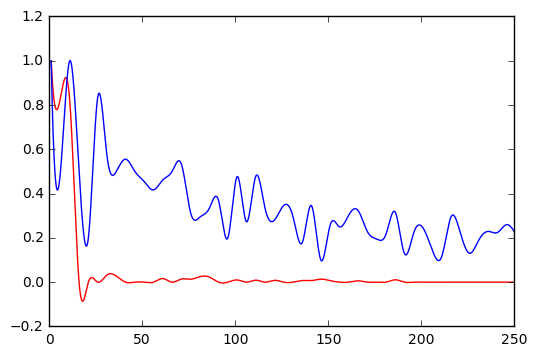

In [378]:
#err_train_int = scipy.interpolate.interp1d(range(1,len(X_train), 5), train_errors, kind='quadratic')
#err_test_int = scipy.interpolate.interp1d(range(1,len(X_train), 5), test_errors, kind='quadratic')
err_train_int = scipy.interpolate.CubicSpline(range(1,len(X_train), 5), train_errors, extrapolate=True)
err_test_int = scipy.interpolate.CubicSpline(range(1,len(X_train), 5), test_errors, extrapolate=True)

x_plot = np.array(range(100,25000))/100.0
y_plot_train = map(err_train_int, x_plot)
y_plot_test = map(err_test_int, x_plot)

plt.plot(x_plot, y_plot_train, '-', color='red')
plt.plot(x_plot, y_plot_test, '-', color='blue')
plt.show

#### FF NN over W2V CBOW

In [40]:
from keras.preprocessing import sequence
from keras.constraints import maxnorm
from keras.models import model_from_json
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers.core import Dense, Dropout, Activation, Merge, Highway, MaxoutDense
from keras.layers.normalization import BatchNormalization
from keras.layers.embeddings import Embedding
from keras.layers.recurrent import LSTM, SimpleRNN, GRU
import keras.optimizers
from keras.regularizers import l2, l1
import keras.backend as K

In [56]:
doc_path = 'D:/CC/document_types_ocred_3.1'

doc_types = sorted(listdir(doc_path))

doc_texts = []
doc_htmls = []

for doc_type in doc_types:
    filenames = sorted(listdir(doc_path + '/' + doc_type))
    filenames = filter(lambda x: re.search(r'\.html$', x), filenames)
    for filename in filenames:
        with open(doc_path + '/' + doc_type + '/' + filename, 'r') as ffile:
            html = ffile.read()
            text_bs = BeautifulSoup(html, 'html.parser')
            doc_texts.append((doc_type, filename, BeautifulSoup.get_text(text_bs)))
            doc_htmls.append(html)
            
print(len(doc_texts))

1668


In [57]:
tokenizer = RegexpTokenizer(r'[a-z]{3,}')
lables, filenames, texts = zip(*doc_texts)
lables = list(lables)
filenames = list(filenames)
texts = map (lambda x: stemmer.stem(x), list(texts))
lable_dict = dict(zip(list(set(lables)), range(len(set(lables)))))
inv_lable_dict = dict(zip(lable_dict.values(), lable_dict.keys()))

lables_int = np.array(map(lambda x: lable_dict[x], lables))

texts = map(lambda x: tokenizer.tokenize(x), texts)

In [55]:
#skip-grams
#word_model = gensim.models.word2vec.Word2Vec(texts, size=300, window=3, min_count=1, workers=8, iter=1000, sg=1, hs=1)
word_model = gensim.models.word2vec.Word2Vec.load('email_routing_w2v.model')

In [57]:
#word_model.save('email_routing_w2v.model')

In [58]:
#texts, lables_int = zip(*filter(lambda x: len(x[0])>0, zip(texts, lables_int)))
#texts = list(texts)
#lables_int = list(lables_int)
#X_train_texts, X_test_texts, y_train, y_test = train_test_split(texts, lables_int, test_size=0.20, random_state=42)

#train_ind, test_ind = train_test_split(range(len(texts)), test_size = 0.2 ,random_state=42)
X = np.array(texts)
y = np.array(lables_int)

X_train_texts = X[train_ind]
X_test_texts = X[test_ind]
y_train = y[train_ind]
y_test = y[test_ind]



X_train_text = map(lambda y: np.mean(np.array(map(lambda x: word_model[x], y)), axis=0) if len(y)>0 else np.zeros(300), X_train_texts)
X_test_text = map(lambda y: np.mean(np.array(map(lambda x: word_model[x], y)), axis=0)  if len(y)>0 else np.zeros(300), X_test_texts)

In [59]:
X_train_text = np.array(X_train_text)
X_test_text = np.array(X_test_text)
y_train = np.array(y_train)
y_test = np.array(y_test)

y_train_nn = np.zeros([len(y_train), max(y_train)+1])
for n,i in enumerate(y_train):
    y_train_nn[n][i] = 1
y_test_nn = np.zeros([len(y_test), max(y_test)+1])
for n,i in enumerate(y_test):
    y_test_nn[n][i] = 1

In [99]:
model = Sequential()    
model.add(Dense(512, input_dim=X_train_text.shape[1]))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dense(128))
model.add(Activation('relu'))    
model.add(Dropout(0.5))
model.add(Dense(19))
model.add(Activation('softmax'))

In [100]:
rms = keras.optimizers.RMSprop(lr=0.00005)
sgd = keras.optimizers.sgd(lr=0.007)
topk = lambda x, y: keras.metrics.top_k_categorical_accuracy(x, y, k=1)
model.compile(loss='categorical_crossentropy',
               optimizer=sgd,
               metrics=[topk])
stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=15, verbose=0, mode='auto')


In [101]:
print (X_train_text.shape, y_train_nn.shape)
model.fit (X_train_text, y_train_nn, batch_size=10, nb_epoch=1000, callbacks=[stop], validation_data=(X_test_text, y_test_nn))

score, acc = model.evaluate (X_test_text, y_test_nn, batch_size=100)
print ('\n')
print('Test score :', score)
print('Test accuracy :', acc)

(1334L, 300L) (1334L, 19L)
Train on 1334 samples, validate on 334 samples
Epoch 1/1000
1334/1334 [==============================] - 0s - loss: 2.5014 - <lambda>: 0.2886 - val_loss: 2.6895 - val_<lambda>: 0.5329
Epoch 2/1000
1334/1334 [==============================] - 0s - loss: 1.6974 - <lambda>: 0.5292 - val_loss: 2.2219 - val_<lambda>: 0.5928
Epoch 3/1000
1334/1334 [==============================] - 0s - loss: 1.4208 - <lambda>: 0.5945 - val_loss: 1.6568 - val_<lambda>: 0.6737
Epoch 4/1000
1334/1334 [==============================] - 0s - loss: 1.1649 - <lambda>: 0.6529 - val_loss: 1.2478 - val_<lambda>: 0.7216
Epoch 5/1000
1334/1334 [==============================] - 0s - loss: 1.0302 - <lambda>: 0.6859 - val_loss: 1.0982 - val_<lambda>: 0.7216
Epoch 6/1000
1334/1334 [==============================] - 0s - loss: 0.9371 - <lambda>: 0.7129 - val_loss: 1.0256 - val_<lambda>: 0.7455
Epoch 7/1000
1334/1334 [==============================] - 0s - loss: 0.8669 - <lambda>: 0.7316 - val_los

### Basic Ensembling

In [103]:
nn_probs = model.predict_proba(X_test_text)

 32/334 [=>............................] - ETA: 0s

In [102]:
bst_probs[0]

array([  5.68751149e-04,   9.63325318e-05,   2.16897026e-05,
         6.51326531e-05,   7.12909906e-05,   7.72724001e-05,
         5.73980059e-05,   7.80164049e-05,   2.33578727e-04,
         9.73635271e-06,   3.96631813e-05,   9.93513047e-01,
         1.04690906e-04,   7.71406211e-05,   4.38011823e-03,
         7.33194110e-05,   4.32195579e-05,   3.78929386e-04,
         1.10672904e-04])

In [104]:
nn_probs[0]

array([  2.54038838e-07,   2.33897481e-05,   7.09314054e-06,
         1.97297845e-06,   2.76730788e-07,   9.51447328e-06,
         6.33579975e-06,   1.53266274e-06,   2.75103707e-06,
         1.60992895e-05,   1.59171213e-06,   9.99847472e-01,
         3.38292034e-06,   4.30011314e-05,   1.01360083e-05,
         7.34139030e-06,   6.40974395e-06,   5.92613969e-06,
         5.54883809e-06], dtype=float32)

In [105]:
avg_ensemble_probs = (nn_probs + bst_probs)/2

In [110]:
avg_ensemble_preds = map(decision, avg_ensemble_probs)

In [115]:
accuracy = 1.0*map(lambda x,y: 1 if x == y else 0, y_test, avg_ensemble_preds).count(1)/len(y_test)
print(accuracy)

0.823353293413


In [122]:
len(filter(lambda x: (x[0] == 11) & (x[1] == 0), zip(y_test, y_test - avg_ensemble_preds)))

66

In [125]:
map_ = []
comp = zip(y_test, y_test - avg_ensemble_preds)
for i in inv_lable_dict.keys():
    precision = 1.0*len(filter(lambda x: (x[0] == i) & (x[1] == 0), comp))/list(y_test).count(i)
    print(inv_lable_dict[i], 'precision is: \t', precision)
    map_.append(precision)
    
print('\n\nTest set MAP is: \t', sum(map_)/len(map_))

I9 precision is: 	 1.0
VOE precision is: 	 1.0
IMMUN precision is: 	 0.5
Phys precision is: 	 0.714285714286
Drug test precision is: 	 0.913043478261
EMP VERF precision is: 	 1.0
Resume precision is: 	 1.0
IDs precision is: 	 0.545454545455
INVC_3 precision is: 	 1.0
BCKGRN precision is: 	 0.714285714286
COC precision is: 	 0.875
Other precision is: 	 0.767441860465
Certs precision is: 	 0.772727272727
Timecards precision is: 	 0.9
Blank fax precision is: 	 0.714285714286
Fit test precision is: 	 0.913043478261
W4 precision is: 	 0.909090909091
INVC_1 precision is: 	 0.75
INVC_2 precision is: 	 0.8


Test set MAP is: 	 0.830982036164


#### FF CV

In [120]:
texts, lables_int = zip(*filter(lambda x: len(x[0])>0, zip(texts, lables_int)))
texts = list(texts)
lables_int = list(lables_int)

X = np.array(texts)
y = np.array(lables_int)
cv = sklearn.model_selection.KFold(n_splits=5, random_state=42, shuffle=True)

In [123]:
cc = 0
accs = []
mistakes = []
incorrect_classes = Counter()
incorrect_files = Counter()
common_mistakes = Counter()
for i ,j in  cv.split(range(len(X))):
    print ('Fold', cc, '...')
    X_train_text, X_test_text = X[i], X[j]
    y_train, y_test = y[i], y[j]
    
    X_train = map(lambda y: np.mean(np.array(map(lambda x: word_model[x], y)), axis=0), X_train_text)
    X_test = map(lambda y: np.mean(np.array(map(lambda x: word_model[x], y)), axis=0), X_test_text)
    X_test = np.array(X_test)
    X_train = np.array(X_train)
    
    y_train_nn = np.zeros([len(y_train), max(y_train)+1])
    for n,k in enumerate(y_train):
        y_train_nn[n][k] = 1
    
    y_test_nn = np.zeros([len(y_test), max(y_test)+1])
    for n,k in enumerate(y_test):
        y_test_nn[n][k] = 1
    
    model = Sequential()    
    model.add(Dense(1024, input_dim=X_train.shape[1]))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(Dense(128))
    model.add(Activation('relu'))    
    model.add(Dropout(0.5))
    model.add(Dense(19))
    model.add(Activation('softmax'))
    
    #adam = keras.optimizers.Adam(lr=0.0001)
    rms = keras.optimizers.RMSprop(lr=0.0001)
    topk = lambda x, y: keras.metrics.top_k_categorical_accuracy(x, y, k=1)
    model.compile(loss='categorical_crossentropy',
                   optimizer=rms,
                   metrics=[topk])
    stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, verbose=0, mode='auto')

    model.fit (X_train, y_train_nn, batch_size=X_train.shape[0], nb_epoch=1000, callbacks=[stop], verbose=0,
               validation_data=(X_test, y_test_nn))

    xxx = model.predict_classes (X_test, verbose=0)    
    
#    accuracy = 1.0*map(lambda x,y: 1 if x == y else 0, y_test, xxx).count(1)/len(y_test)    
    _, accuracy = model.evaluate (X_test, y_test_nn, verbose=0) 
    accs.append(accuracy)
    
    for pr in range(len(xxx)):
        if xxx[pr] != y_test[pr]:
#             print('pred:', inv_lable_dict[xxx[pr]])
#             print('true:', inv_lable_dict[y_test[pr]])
#             print(doc_texts[j[pr]][1], '\n')
            mistakes.append({'pred': inv_lable_dict[xxx[pr]], 'true':inv_lable_dict[y_test[pr]], 'file':doc_texts[j[pr]][1]})
            incorrect_classes[inv_lable_dict[y_test[pr]]] += 1
            incorrect_files[doc_texts[j[pr]][1]] += 1
            common_mistakes[(inv_lable_dict[xxx[pr]], inv_lable_dict[y_test[pr]])] += 1
            #print(doc_texts[j][2])
    
    print ('---------------------------------\n', 'Done')
    print ('Fold', cc, 'accuracy :\t', accuracy, '\n')
    cc += 1    
cv_acc = sum(accs)/len(accs)
print ('%s-Fold cross-validation accuracy over %s classes for the basic FF NN model is:' % (cv.n_splits,len(lable_dict)), cv_acc)

Fold 0 ...
---------------------------------
 Done
Fold 0 accuracy :	 0.836363636364 

Fold 1 ...
---------------------------------
 Done
Fold 1 accuracy :	 0.790909090909 

Fold 2 ...
---------------------------------
 Done
Fold 2 accuracy :	 0.784194528875 

Fold 3 ...
---------------------------------
 Done
Fold 3 accuracy :	 0.790273556231 

Fold 4 ...
---------------------------------
 Done
Fold 4 accuracy :	 0.80547112462 

5-Fold cross-validation accuracy over 19 classes for the basic FF NN model is: 0.8014423874


In [126]:
mistakes_df = pd.DataFrame(mistakes)

In [128]:
mistakes_df.to_excel('5f_cv_mistakes.xls')

In [79]:
sorted(incorrect_classes.items(), key =lambda x: x[1], reverse = True)

[('Other', 63),
 ('BCKGRN', 36),
 ('IDs', 25),
 ('Blank fax', 21),
 ('Certs', 20),
 ('VOE', 19),
 ('IMMUN', 18),
 ('INVC_3', 18),
 ('COC', 17),
 ('Phys', 15),
 ('INVC_2', 14),
 ('Fit test', 11),
 ('Drug test', 10),
 ('EMP VERF', 10),
 ('W4', 10),
 ('Resume', 6),
 ('INVC_1', 6),
 ('Timecards', 4),
 ('I9', 3)]

In [80]:
#182
print(len(incorrect_files))
sorted(common_mistakes.items(), key =lambda x: x[1], reverse = True)

326


[(('Other', 'BCKGRN'), 31),
 (('BCKGRN', 'Other'), 14),
 (('Other', 'Certs'), 14),
 (('Other', 'Blank fax'), 13),
 (('Other', 'INVC_2'), 10),
 (('Other', 'VOE'), 10),
 (('Other', 'IDs'), 10),
 (('COC', 'IMMUN'), 9),
 (('Phys', 'Other'), 9),
 (('Other', 'W4'), 8),
 (('INVC_2', 'INVC_3'), 7),
 (('Other', 'IMMUN'), 7),
 (('Fit test', 'Phys'), 6),
 (('Phys', 'COC'), 6),
 (('Other', 'Phys'), 6),
 (('Other', 'Resume'), 6),
 (('W4', 'Other'), 6),
 (('Other', 'INVC_3'), 6),
 (('COC', 'Other'), 6),
 (('INVC_1', 'INVC_3'), 5),
 (('VOE', 'EMP VERF'), 5),
 (('Certs', 'Other'), 5),
 (('I9', 'IDs'), 5),
 (('EMP VERF', 'Other'), 5),
 (('Other', 'Drug test'), 4),
 (('BCKGRN', 'VOE'), 4),
 (('IMMUN', 'COC'), 4),
 (('Other', 'Timecards'), 4),
 (('Phys', 'Fit test'), 4),
 (('Fit test', 'Other'), 4),
 (('Fit test', 'COC'), 4),
 (('Certs', 'IDs'), 3),
 (('COC', 'Drug test'), 3),
 (('IMMUN', 'Drug test'), 3),
 (('Other', 'COC'), 3),
 (('VOE', 'BCKGRN'), 3),
 (('VOE', 'Other'), 3),
 (('INVC_3', 'INVC_2'), 3)

#### HTML Tag structure addition

In [64]:
doc_path = 'D:/CC/document_types_ocred_3.1'

doc_types = sorted(listdir(doc_path))

doc_texts = []
doc_htmls = []

for doc_type in doc_types:
    filenames = sorted(listdir(doc_path + '/' + doc_type))
    filenames = filter(lambda x: re.search(r'\.html$', x), filenames)
    for filename in filenames:
        with open(doc_path + '/' + doc_type + '/' + filename, 'r') as ffile:
            html = ffile.read()
            text_bs = BeautifulSoup(html, 'html.parser')
            doc_texts.append((doc_type, filename, BeautifulSoup.get_text(text_bs)))
            doc_htmls.append(html)
            
print(len(doc_texts))

1668


In [65]:
lables, filenames, texts = zip(*doc_texts)
lables = list(lables)
filenames = list(filenames)
texts = map (lambda x: stemmer.stem(x), list(texts))
lable_dict = dict(zip(list(set(lables)), range(len(set(lables)))))
inv_lable_dict = dict(zip(lable_dict.values(), lable_dict.keys()))

lables_int = np.array(map(lambda x: lable_dict[x], lables))

In [5]:
a = doc_htmls[0]
aa = re.findall(ur'<.*?>' , a)
aaa = map (lambda x: re.sub(ur' .*?(?=>)', '', x), aa)

dic_tag = Counter(aaa)
len(dic_tag)

anchor = 48
dic_tag_sym = {}

for i in range(len(dic_tag)):
    sym = unichr(anchor+i)
    dic_tag_sym[dic_tag.keys()[i]] = sym

dic_tag_sym

aaaa = map(lambda x: dic_tag_sym[x], aaa)
print(''.join(aaaa))

9A??:T31U71URNRNRNSD1URNB5PRNH2PRNH5PRNHPRNHPRNH2PRNRNHPRNHPRNHPRNHPROLOLNHPRNH5PRNH2M5PRNH2M5PRNH25PRNH2M5PRNHPRNH2M5PRNH2M5PRNH2M5PRNH2M5PRNH2M5PRNH2M5PRNH2M5PRNRNRNH2PR1UNH61URNQPRNHPRNHPRNHPRNRNRNRNRNRNH50@G<I4@GPRNRNHI4;2M5<2M5<2M5PRNH2MPRNH5PRNH2M5PRNRNRNH2M5PRNRNRNH2M5PRNRNRNH2M5PRNRNRNH2M5PRNRNRNH2M5PRNH2M5PRNRNRNH2M5PRNRNRNH2M5PRNRNRNH2M5PRNRNRNH25PRNH2PRNRNRNHPRNRNRNHPRNHPRNH5PRNRNRNHPRNRNRNHPRNRNRNHPRNRNRNH2M5PRNRNRNHPRNRNRNHPRNRNRNHPRNRNRNRNRNH2M5PRNRNRNHPRNRNRNHPRNRNRNHPRNRNRNHPRNRNRNHPRNHPRNRNRNHPRNRNHPRNRNRNHPRNRNRNHPRNRNRNHPRNRNRNHPRNRNRNHPRNRNRNHPRNRNRNRNRNHPRNRNRNRNH2M5PRNRNRNHPRNRNROLNHPRNRNRNHPRNRNRNHPRNRNRNHPRNHPRNRNRNHPRNRNHPRNRNRNHPRNRNRNRNRNHPRNRNRNHPRNRNRNHPRNHPRNRNRNHPRNRNRNHPRNRNRNHPRNRNRNH2M5PRNH2PRNHPRNH81URNKPRNH81URNKPRNHJ1URNRN>PRNRNHPRNH5PRNHPRNHPRNHPRNH2PRNHPRNHPRNHPRNH5PRNHPRNHPRNHPRNRNRNHPRNRNRNHPRNRNRNHPRNRNRNHPRNRNRNHPRNRNRNHPRNRNRNRNRNHPRNRNRNHPRNRNRNHPRNRNRNH2M5PRNRNRNHPRNRNRNHPRNRNRNHPRNRNRNHPRNRNROLNHPRNRNRNHPRNRNRNH2M5PRNRNRNHPRNRNRNHPRNRNRNH2

In [6]:
tags_dirty = map(lambda x: re.findall(ur'<.*?>' , x), doc_htmls)
tags_clean = map(lambda x: map(lambda y: re.sub(ur' .*?(?=>)', '', y), x), tags_dirty)

In [7]:
dic_tag = Counter()
_ = map(lambda x: dic_tag.update(x), tags_clean)

In [8]:
dic_tag_num = dict(zip(dic_tag.keys(), range(len(dic_tag))))
tags_encoded = map(lambda x: map(lambda y: dic_tag_num[y] , x), tags_clean)
lengths = map(lambda x: len(x) , tags_encoded)

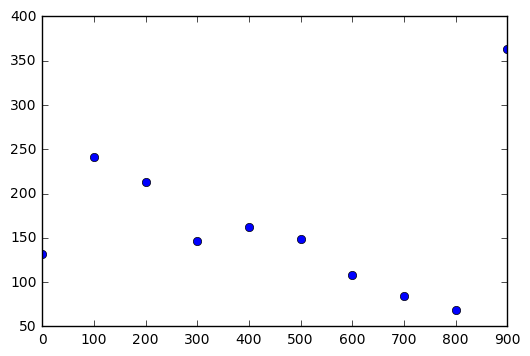

In [9]:
x = range(0, 1000, 100)
xx = dict(zip (x, map (lambda a: 0, x)))

for i in lengths:
    try:
        xx[(i/100)*100] +=1
    except KeyError :
        xx[900] += 1
        
%matplotlib inline
plt.plot(xx.keys(), xx.values(), 'bo')
plt.show()

In [10]:
X = sequence.pad_sequences(tags_encoded, maxlen= 512, dtype = 'int')

In [23]:
y = lables_int
y_nn = np.zeros([len(y), max(y)+1])
for n,i in enumerate(y):
    y_nn[n][i] = 1

In [24]:
train_ind, test_ind = train_test_split(range(len(X)), test_size = 0.2 ,random_state=42)

X_train = X[train_ind]
X_test = X[test_ind]

y_train = y_nn[train_ind]
y_test = y_nn[test_ind]

In [28]:
model = Sequential()
model.add(Embedding(len(dic_tag_num)+1, 16, mask_zero=True, input_length=512))
model.add(BatchNormalization())
model.add(Dropout(0.5))
model.add(LSTM(16, init='glorot_uniform', inner_init='orthogonal', 
              activation='relu', inner_activation='hard_sigmoid', W_regularizer=None, U_regularizer=None,
              b_regularizer=None, dropout_W=0.1, dropout_U=0.1))
model.add(Dense(16))
model.add(Activation('relu'))
model.add(Dense(19))
model.add(Activation('softmax'))

stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=2, verbose=0, mode='auto')
batch_size = 16
lr = 0.01
ada = keras.optimizers.Adamax(lr=lr)
model.compile(loss='categorical_crossentropy', optimizer='adagrad', metrics=['accuracy'])

In [ ]:
model.fit (X_train, y_train, batch_size=batch_size, verbose=1, nb_epoch=100, callbacks=[stop], 
           validation_data=(X_test, y_test))

score, acc = model.evaluate (X_test, y_test, batch_size=batch_size, verbose = 0)

print ('\n')
print('Test score :', score)
print('Test accuracy :', acc)

In [11]:
for i,j in enumerate(tags_clean):
    print(lables[i])
    print(j)
    print('\n-----------------------------------------------------------------------\n')

BCKGRN
['<html>', '<head>', '<meta>', '<meta>', '<link>', '</head>', '<body>', '<a>', '</a>', '<h1>', '<a>', '</a>', '<span>', '</span>', '<span>', '</span>', '<span>', '</span>', '</h1>', '<h2>', '<a>', '</a>', '<span>', '</span>', '</h2>', '<div>', '<p>', '<span>', '</span>', '</p>', '</div>', '<p>', '<span>', '</span>', '</p>', '<div>', '<p>', '<span>', '</span>', '</p>', '<p>', '<span>', '</span>', '</p>', '<p>', '<span>', '</span>', '</p>', '</div>', '<p>', '<span>', '</span>', '<span>', '</span>', '</p>', '<p>', '<span>', '</span>', '</p>', '<p>', '<span>', '</span>', '</p>', '<p>', '<span>', '</span>', '</p>', '<p>', '<span>', '<sub>', '</sub>', '<sub>', '</sub>', '</span>', '</p>', '<p>', '<span>', '</span>', '</p>', '<div>', '<p>', '<span>', '</span>', '</p>', '</div>', '<br>', '<div>', '<p>', '<span>', '</span>', '</p>', '</div>', '<br>', '<div>', '<p>', '<span>', '</span>', '</p>', '</div>', '<div>', '<p>', '<span>', '</span>', '</p>', '</div>', '<br>', '<div>', '<p>', '<spa

In [21]:
tag_model = gensim.models.word2vec.Word2Vec(tags_clean, size=32, window=7, min_count=1, workers=8, iter=100, sg=1, hs=1)

In [89]:
X_train_tags, X_test_tags, y_train_tag, y_test_tag = train_test_split(tags_clean, lables_int, test_size=0.20, random_state=42)
X_train_tag = map(lambda y: np.mean(np.array(map(lambda x: tag_model[x], y)), axis=0), X_train_tags)
X_test_tag = map(lambda y: np.mean(np.array(map(lambda x: tag_model[x], y)), axis=0), X_test_tags)

In [90]:
X_train_tag = np.array(X_train_tag)
X_test_tag = np.array(X_test_tag)
y_train = np.array(y_train)
y_test = np.array(y_test)

y_train_nn = np.zeros([len(y_train), max(y_train)+1])
for n,i in enumerate(y_train):
    y_train_nn[n][i] = 1
y_test_nn = np.zeros([len(y_test), max(y_test)+1])
for n,i in enumerate(y_test):
    y_test_nn[n][i] = 1

In [33]:
model = Sequential()    
model.add(Dense(1024, input_dim=X_train.shape[1]))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dense(128))
model.add(Activation('relu'))    
model.add(Dropout(0.5))
model.add(Dense(19))
model.add(Activation('softmax'))

rms = keras.optimizers.RMSprop(lr=0.001)
sgd = keras.optimizers.sgd(lr=0.01)
model.compile(loss='categorical_crossentropy',
               optimizer=rms,
               metrics=['accuracy'])
stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=25, verbose=0, mode='auto')


print (X_train.shape, y_train.shape)
model.fit (X_train, y_train_nn, batch_size=32, nb_epoch=100, callbacks=[stop], validation_data=(X_test, y_test_nn))

score, acc = model.evaluate (X_test, y_test_nn, batch_size=100)
print ('\n')
print('Test score :', score)
print('Test accuracy :', acc)

(1334L, 32L) (1334L,)
Train on 1334 samples, validate on 334 samples
Epoch 1/100
1334/1334 [==============================] - 0s - loss: 2.8107 - acc: 0.2091 - val_loss: 2.9173 - val_acc: 0.2665
Epoch 2/100
1334/1334 [==============================] - 0s - loss: 2.5527 - acc: 0.2744 - val_loss: 2.8944 - val_acc: 0.2725
Epoch 3/100
1334/1334 [==============================] - 0s - loss: 2.4483 - acc: 0.2811 - val_loss: 2.8953 - val_acc: 0.2605
Epoch 4/100
1334/1334 [==============================] - 0s - loss: 2.4419 - acc: 0.2781 - val_loss: 2.8718 - val_acc: 0.2635
Epoch 5/100
1334/1334 [==============================] - 0s - loss: 2.4060 - acc: 0.3028 - val_loss: 2.8475 - val_acc: 0.2635
Epoch 6/100
1334/1334 [==============================] - 0s - loss: 2.3228 - acc: 0.3058 - val_loss: 2.8331 - val_acc: 0.2695
Epoch 7/100
1334/1334 [==============================] - 0s - loss: 2.3031 - acc: 0.3163 - val_loss: 2.8103 - val_acc: 0.2635
Epoch 8/100
1334/1334 [==========================

In [31]:
model.fit (X_train, y_train_nn, batch_size=100, nb_epoch=100, callbacks=[stop], validation_data=(X_test, y_test_nn))

Train on 1334 samples, validate on 334 samples
Epoch 1/100
1334/1334 [==============================] - 0s - loss: 1.4124 - acc: 0.5457 - val_loss: 2.0808 - val_acc: 0.3832
Epoch 2/100
1334/1334 [==============================] - 0s - loss: 1.4035 - acc: 0.5375 - val_loss: 2.0370 - val_acc: 0.3892
Epoch 3/100
1334/1334 [==============================] - 0s - loss: 1.4078 - acc: 0.5630 - val_loss: 2.0427 - val_acc: 0.3952
Epoch 4/100
1334/1334 [==============================] - 0s - loss: 1.3776 - acc: 0.5682 - val_loss: 2.0188 - val_acc: 0.3952
Epoch 5/100
1334/1334 [==============================] - 0s - loss: 1.4127 - acc: 0.5360 - val_loss: 1.9716 - val_acc: 0.3982
Epoch 6/100
1334/1334 [==============================] - 0s - loss: 1.3987 - acc: 0.5532 - val_loss: 1.9916 - val_acc: 0.4042
Epoch 7/100
1334/1334 [==============================] - 0s - loss: 1.4031 - acc: 0.5540 - val_loss: 1.9960 - val_acc: 0.3922
Epoch 8/100
1334/1334 [==============================] - 0s - loss: 1.4

In [76]:
X_train = np.hstack([X_train_text, X_train_tag])
X_test = np.hstack([X_test_text, X_test_tag])

In [102]:
model1 = Sequential()    
model1.add(Dense(128, input_dim=X_train_text.shape[1]))
#model1.add(BatchNormalization())
model1.add(Activation('relu'))
model.add(Dropout(0.5))
model1.add(Dense(1024))
model1.add(Activation('relu'))    

model2 = Sequential()    
model2.add(Dense(16, input_dim=X_train_tag.shape[1]))
#model2.add(BatchNormalization())
model2.add(Activation('relu'))
model.add(Dropout(0.5))
model2.add(Dense(64))
model2.add(Activation('relu'))    

model = Sequential()
model.add(Merge([model1, model2], mode='concat', concat_axis=1))
model.add(BatchNormalization())
model.add(Dropout(0.5))
model.add(Dense(512))
model.add(Activation('relu'))    
model.add(Dense(19))
model.add(Activation('softmax'))

ada = keras.optimizers.Adamax(lr=0.0005)
sgd = keras.optimizers.sgd(lr=0.01)
topk = lambda x, y: keras.metrics.top_k_categorical_accuracy(x, y, k=3)

model.compile(loss='categorical_crossentropy',
               optimizer=ada,
               metrics=[topk])

stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, verbose=0, mode='auto')

model.fit ([X_train_text, X_train_tag], y_train_nn, batch_size=100, nb_epoch=100, callbacks=[stop], 
           validation_data=([X_test_text, X_test_tag], y_test_nn))

score, acc = model.evaluate ([X_test_text, X_test_tag], y_test_nn, batch_size=100)
print ('\n')
print('Test score :', score)
print('Test accuracy :', acc)

Train on 1334 samples, validate on 334 samples
Epoch 1/100
1334/1334 [==============================] - 0s - loss: 2.2444 - <lambda>: 0.6027 - val_loss: 2.8589 - val_<lambda>: 0.6707
Epoch 2/100
1334/1334 [==============================] - 0s - loss: 1.1937 - <lambda>: 0.8703 - val_loss: 2.8241 - val_<lambda>: 0.7814
Epoch 3/100
1334/1334 [==============================] - 0s - loss: 0.8998 - <lambda>: 0.9138 - val_loss: 2.7947 - val_<lambda>: 0.8084
Epoch 4/100
1334/1334 [==============================] - 0s - loss: 0.7519 - <lambda>: 0.9340 - val_loss: 2.7696 - val_<lambda>: 0.8473
Epoch 5/100
1334/1334 [==============================] - 0s - loss: 0.6414 - <lambda>: 0.9640 - val_loss: 2.7427 - val_<lambda>: 0.8743
Epoch 6/100
1334/1334 [==============================] - 0s - loss: 0.5897 - <lambda>: 0.9603 - val_loss: 2.7169 - val_<lambda>: 0.8802
Epoch 7/100
1334/1334 [==============================] - 0s - loss: 0.5328 - <lambda>: 0.9708 - val_loss: 2.6885 - val_<lambda>: 0.9012
E

### Header-separated texts

In [153]:
doc_htmls = map(lambda x: re.sub('&nbsp', ' ', x), doc_htmls)

In [154]:
header_structure = map(lambda x: re.findall(r'<h\d.*?>[^<]*?</h\d>', x), doc_htmls)
header_structure = map(lambda x: map(lambda y: re.sub(ur'(?<=<h\d) .*?(?=>)', '', y), x), header_structure)
header_structure = map(lambda x: map(lambda y: re.sub(ur'<(?!h\d)>', '', y), x), header_structure)
header_texts = map(lambda x: map(lambda y: re.sub(r' +', ' ', ' '.join(re.findall(r'(?<=>)[^<>]+?(?=<)', y))), x), 
                   header_structure)

In [155]:
body_texts = map(lambda x: re.split(r'<h\d.*?>[^<]*?</h\d>', x), doc_htmls)
body_texts = map(lambda x,y: x if len(x) > 0 else [y], body_texts, doc_htmls)
body_texts = map(lambda x: map(lambda y: re.sub(r'<[\s\S]*?>', ' ', y), x), body_texts)
body_texts = map(lambda x: map(lambda y: re.sub(r' +', ' ', y), x), body_texts)

In [156]:
sequence_texts = map(lambda x1,y1: map(lambda x2, y2: [x2,y2], x1, y1[1:]) if len(x1) > 0 else [], header_texts, body_texts)
sequence_texts = map(lambda x: reduce(lambda y,z: y+z, x) if len(x) > 0 else x, sequence_texts)
sequence_texts = map(lambda x1,y1: [x1]+y1, map(lambda x2: x2[0], body_texts), sequence_texts)

In [157]:
sequence_texts = map(lambda x: map(lambda y: stemmer.stem(unicode(y, 'utf8')), x), sequence_texts)
sequence_texts = map(lambda x: map(lambda y: tokenizer.tokenize(y), x), sequence_texts)
#sequence_texts = map(lambda x: map(lambda y: map(lambda z: stemmer.stem(z), y), x), sequence_texts)

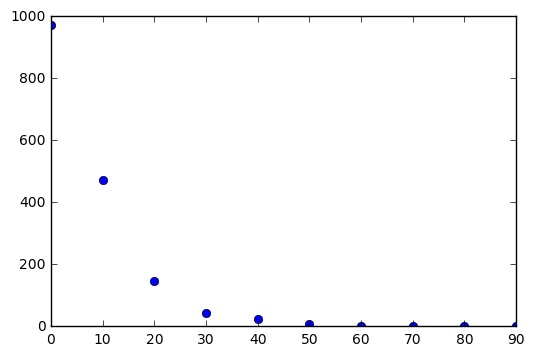

In [158]:
lengths = map(lambda x: len(x) , sequence_texts)
x = range(0, 100, 10)
xx = dict(zip (x, map (lambda a: 0, x)))

for i in lengths:
    try:
        xx[(i/10)*10] +=1
    except KeyError :
        xx[90] += 1
        
%matplotlib inline
plt.plot(xx.keys(), xx.values(), 'bo')
plt.show()

In [163]:
sequence_texts = map(lambda x: map(lambda y: [u'_EMPTY_'] if len(y)== 0 else y, x), sequence_texts)

In [166]:
word_model = gensim.models.word2vec.Word2Vec(reduce(lambda x,y: x+y, sequence_texts), size=300, window=3, min_count=1, workers=8, 
                                             iter=1000, sg=1, hs=1)

In [167]:
word_model.save('email_routing_w2v_2.model')

In [199]:
sequence_texts_vectorized = map(lambda x: np.array(map(lambda y: np.sum(np.array(map(lambda z: word_model[z], y)), axis=0), x)), 
                                sequence_texts)

In [200]:
X = sequence.pad_sequences(sequence_texts_vectorized, maxlen= 30, dtype = 'float32')

In [201]:
X.shape

(1668L, 30L, 300L)

In [202]:
y = lables_int
y_nn = np.zeros([len(y), max(y)+1])
for n,i in enumerate(y):
    y_nn[n][i] = 1
train_ind, test_ind = train_test_split(range(len(X)), test_size = 0.2 ,random_state=42)

X_train = X[train_ind]
X_test = X[test_ind]

y_train = y_nn[train_ind]
y_test = y_nn[test_ind]

In [203]:
model = Sequential()
model.add(BatchNormalization(input_shape=X_train.shape[1:]))
model.add(LSTM(300, init='glorot_uniform', inner_init='orthogonal', forget_bias_init='one',
                activation='tanh', inner_activation='hard_sigmoid', W_regularizer=None, U_regularizer=None,
                b_regularizer=None, dropout_W=0.1, dropout_U=0.1))
model.add(Dropout(0.5))
model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(19))
model.add(Activation('softmax'))

In [204]:
model.compile(loss='categorical_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])
stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, verbose=0, mode='auto')

In [205]:
model.fit (X_train, y_train, batch_size=100, nb_epoch=100, callbacks=[stop], validation_data=(X_test, y_test))

Train on 1334 samples, validate on 334 samples
Epoch 1/100
1334/1334 [==============================] - 29s - loss: 2.6527 - acc: 0.2256 - val_loss: 2.1324 - val_acc: 0.4132
Epoch 2/100
1334/1334 [==============================] - 28s - loss: 2.1515 - acc: 0.3928 - val_loss: 1.8080 - val_acc: 0.4970
Epoch 3/100
1334/1334 [==============================] - 28s - loss: 1.9024 - acc: 0.4370 - val_loss: 1.6188 - val_acc: 0.5060
Epoch 4/100
1334/1334 [==============================] - 29s - loss: 1.6662 - acc: 0.5127 - val_loss: 1.4064 - val_acc: 0.5749
Epoch 5/100
1334/1334 [==============================] - 29s - loss: 1.4782 - acc: 0.5772 - val_loss: 1.2796 - val_acc: 0.6138
Epoch 6/100
1334/1334 [==============================] - 32s - loss: 1.3542 - acc: 0.6004 - val_loss: 1.1694 - val_acc: 0.6527
Epoch 7/100
1334/1334 [==============================] - 30s - loss: 1.2196 - acc: 0.6297 - val_loss: 1.1437 - val_acc: 0.7036
Epoch 8/100
1334/1334 [==============================] - 30s - l

In [ ]:
model.fit (X_train, y_train, batch_size=100, nb_epoch=100, callbacks=[stop], validation_data=(X_test, y_test))

Train on 1334 samples, validate on 334 samples
Epoch 1/100
1334/1334 [==============================] - 44s - loss: 0.5050 - acc: 0.8358 - val_loss: 0.9983 - val_acc: 0.7605
Epoch 2/100
1334/1334 [==============================] - 47s - loss: 0.4719 - acc: 0.8546 - val_loss: 0.9751 - val_acc: 0.7575
Epoch 3/100
 700/1334 [==============>...............] - ETA: 18s - loss: 0.5236 - acc: 0.8457